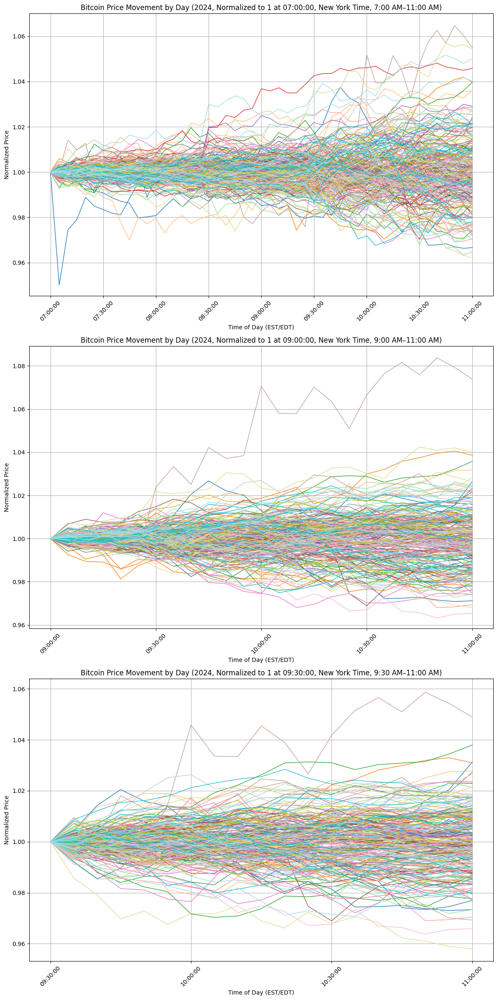

In [6]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from datetime import datetime

# Load data (adjust path to your CSV file)
# Expected format: columns include 'timestamp' (UTC, e.g., '2024-01-01 00:00:00') and 'close' (price)
df = pd.read_csv('bitcoin_5min_coinbase_2024_data.csv')

# Convert timestamp to datetime and to New York time
df['timestamp'] = pd.to_datetime(df['timestamp'])
df['timestamp_ny'] = df['timestamp'].dt.tz_localize('UTC').dt.tz_convert('America/New_York')

# Extract date, time, and weekday
df['date'] = df['timestamp_ny'].dt.date
df['time'] = df['timestamp_ny'].dt.time
df['weekday'] = df['timestamp_ny'].dt.weekday

# Filter for weekdays (Monday=0, ..., Friday=4)
df = df[df['weekday'] < 5]

# Define time windows with consistent end time at 11:00 AM
time_windows = [
    {'start': '07:00:00', 'end': '11:00:00', 'label': '7:00 AM–11:00 AM'},
    {'start': '09:00:00', 'end': '11:00:00', 'label': '9:00 AM–11:00 AM'},
    {'start': '09:30:00', 'end': '11:00:00', 'label': '9:30 AM–11:00 AM'}
]

# Create a figure with subplots (one for each time window)
fig, axes = plt.subplots(len(time_windows), 1, figsize=(12, 8 * len(time_windows)), sharex=False)

# Ensure axes is a list for iteration, even with one subplot
if len(time_windows) == 1:
    axes = [axes]

# Process each time window
for ax, window in zip(axes, time_windows):
    start_time = pd.Timestamp(window['start']).time()
    end_time = pd.Timestamp(window['end']).time()
    
    # Filter for the current time window
    df_window = df[(df['time'] >= start_time) & (df['time'] <= end_time)].copy()
    
    # Normalize prices to 1 at the start time of each day
    start_prices = df_window[df_window['time'] == start_time][['date', 'close']].rename(columns={'close': 'start_price'})
    df_window = df_window.merge(start_prices, on='date', how='left')
    df_window['normalized_price'] = df_window['close'] / df_window['start_price']
    
    # Get unique dates
    unique_dates = df_window['date'].unique()
    
    # Plot each day separately
    colors = plt.cm.tab20(np.linspace(0, 1, len(unique_dates)))  # Distinct colors for each day
    for i, date in enumerate(unique_dates):
        day_df = df_window[df_window['date'] == date]
        ax.plot(day_df['time'].astype(str), day_df['normalized_price'], color=colors[i], linewidth=1)
    
    # Customize plot
    ax.set_title(f'Bitcoin Price Movement by Day (2024, Normalized to 1 at {window["start"]}, New York Time, {window["label"]})')
    ax.set_xlabel('Time of Day (EST/EDT)')
    ax.set_ylabel('Normalized Price')
    ax.grid(True)
    
    # Set x-axis ticks (every 30 minutes for clarity, assuming 5-min data)
    tick_indices = range(0, len(day_df['time']), 6)  # Every 6th point (~30 min)
    if len(day_df) > 0:  # Ensure there’s data to avoid indexing errors
        tick_labels = day_df['time'].iloc[tick_indices].astype(str)
        ax.set_xticks(tick_labels)
        ax.set_xticklabels(tick_labels, rotation=45)
    
    # Set y-axis range with slight buffer
    if not df_window['normalized_price'].empty:
        ax.set_ylim(df_window['normalized_price'].min() * 0.995, df_window['normalized_price'].max() * 1.005)

# Adjust layout to prevent clipping
plt.tight_layout()

# Show plots
plt.show()

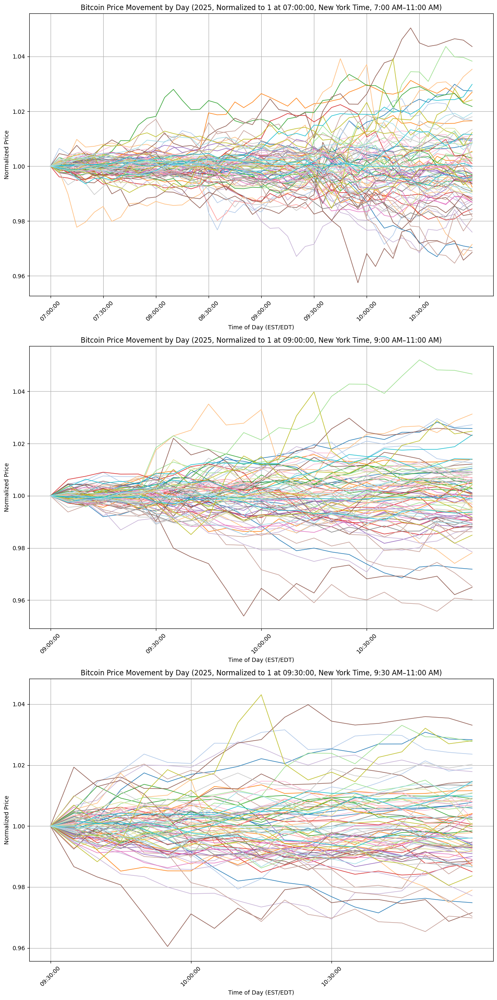

In [5]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from datetime import datetime

# Load data (adjust path to your CSV file)
# Expected format: columns include 'timestamp' (UTC, e.g., '2024-01-01 00:00:00') and 'close' (price)
df = pd.read_csv('bitcoin_5min_coinbase_2025_data.csv')

# Convert timestamp to datetime and to New York time
df['timestamp'] = pd.to_datetime(df['timestamp'])
df['timestamp_ny'] = df['timestamp'].dt.tz_localize('UTC').dt.tz_convert('America/New_York')

# Extract date, time, and weekday
df['date'] = df['timestamp_ny'].dt.date
df['time'] = df['timestamp_ny'].dt.time
df['weekday'] = df['timestamp_ny'].dt.weekday

# Filter for weekdays (Monday=0, ..., Friday=4)
df = df[df['weekday'] < 5]

# Define time windows with consistent end time at 11:00 AM
time_windows = [
    {'start': '07:00:00', 'end': '11:00:00', 'label': '7:00 AM–11:00 AM'},
    {'start': '09:00:00', 'end': '11:00:00', 'label': '9:00 AM–11:00 AM'},
    {'start': '09:30:00', 'end': '11:00:00', 'label': '9:30 AM–11:00 AM'}
]

# Create a figure with subplots (one for each time window)
fig, axes = plt.subplots(len(time_windows), 1, figsize=(12, 8 * len(time_windows)), sharex=False)

# Ensure axes is a list for iteration, even with one subplot
if len(time_windows) == 1:
    axes = [axes]

# Process each time window
for ax, window in zip(axes, time_windows):
    start_time = pd.Timestamp(window['start']).time()
    end_time = pd.Timestamp(window['end']).time()
    
    # Filter for the current time window
    df_window = df[(df['time'] >= start_time) & (df['time'] <= end_time)].copy()
    
    # Normalize prices to 1 at the start time of each day
    start_prices = df_window[df_window['time'] == start_time][['date', 'close']].rename(columns={'close': 'start_price'})
    df_window = df_window.merge(start_prices, on='date', how='left')
    df_window['normalized_price'] = df_window['close'] / df_window['start_price']
    
    # Get unique dates
    unique_dates = df_window['date'].unique()
    
    # Plot each day separately
    colors = plt.cm.tab20(np.linspace(0, 1, len(unique_dates)))  # Distinct colors for each day
    for i, date in enumerate(unique_dates):
        day_df = df_window[df_window['date'] == date]
        ax.plot(day_df['time'].astype(str), day_df['normalized_price'], color=colors[i], linewidth=1)
    
    # Customize plot
    ax.set_title(f'Bitcoin Price Movement by Day (2025, Normalized to 1 at {window["start"]}, New York Time, {window["label"]})')
    ax.set_xlabel('Time of Day (EST/EDT)')
    ax.set_ylabel('Normalized Price')
    ax.grid(True)
    
    # Set x-axis ticks (every 30 minutes for clarity, assuming 5-min data)
    tick_indices = range(0, len(day_df['time']), 6)  # Every 6th point (~30 min)
    if len(day_df) > 0:  # Ensure there’s data to avoid indexing errors
        tick_labels = day_df['time'].iloc[tick_indices].astype(str)
        ax.set_xticks(tick_labels)
        ax.set_xticklabels(tick_labels, rotation=45)
    
    # Set y-axis range with slight buffer
    if not df_window['normalized_price'].empty:
        ax.set_ylim(df_window['normalized_price'].min() * 0.995, df_window['normalized_price'].max() * 1.005)

# Adjust layout to prevent clipping
plt.tight_layout()

# Show plots
plt.show()

**Histograms**

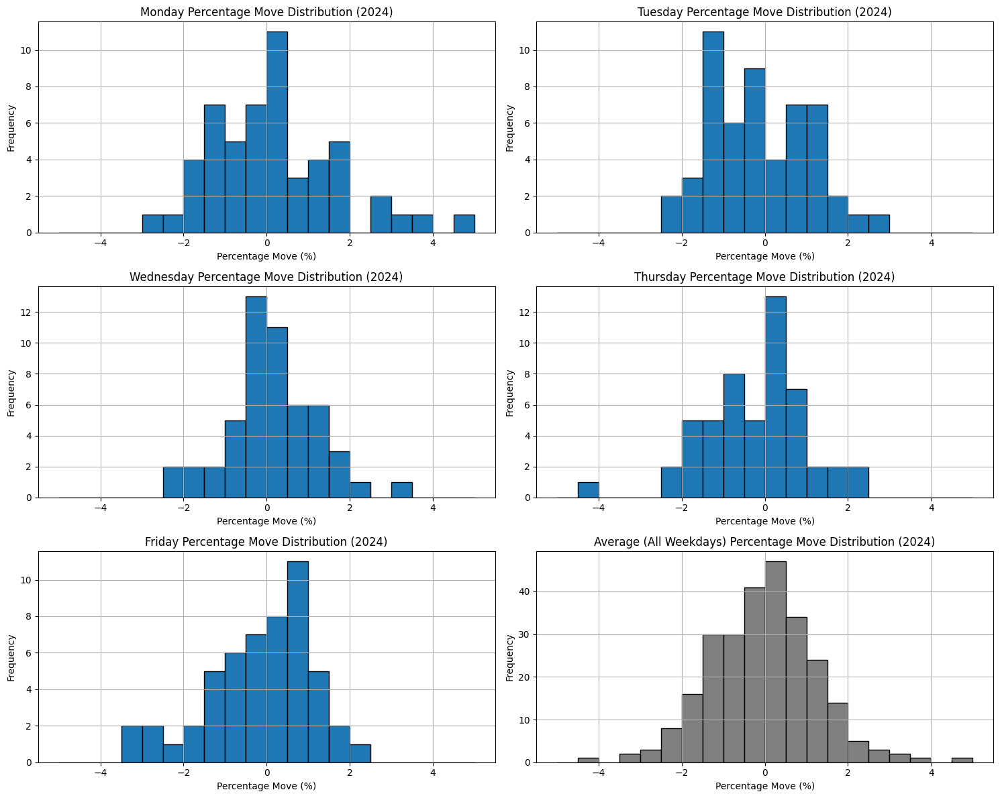

In [7]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from datetime import datetime
import pytz

# Load data (adjust path to your CSV file)
# Expected format: columns include 'timestamp' (UTC, e.g., '2024-01-01 00:00:00') and 'close' (price)
df = pd.read_csv('bitcoin_5min_coinbase_2024_data.csv')

# Convert timestamp to datetime and to New York time
df['timestamp'] = pd.to_datetime(df['timestamp'])
df['timestamp_ny'] = df['timestamp'].dt.tz_localize('UTC').dt.tz_convert('America/New_York')

# Extract date, time, and weekday
df['date'] = df['timestamp_ny'].dt.date
df['time'] = df['timestamp_ny'].dt.time
df['weekday'] = df['timestamp_ny'].dt.weekday

# Filter for weekdays (Monday=0, ..., Friday=4)
df = df[df['weekday'] < 5]

# Filter for 9:30 AM to 11:00 AM
start_time = pd.Timestamp('09:30:00').time()
end_time = pd.Timestamp('11:00:00').time()
df = df[(df['time'] >= start_time) & (df['time'] <= end_time)]

# Normalize prices to 1 at 9:30 AM each day
start_prices = df[df['time'] == start_time][['date', 'close']].rename(columns={'close': 'start_price'})
df = df.merge(start_prices, on='date', how='left')
df['normalized_price'] = df['close'] / df['start_price']

# Calculate percentage move from 9:30 AM to 11:00 AM for each day
daily_moves = df[df['time'] == end_time][['date', 'weekday', 'normalized_price']].rename(columns={'normalized_price': 'end_price'})
daily_moves['percent_move'] = (daily_moves['end_price'] - 1) * 100  # Convert to percentage

# Define weekday names and add 'Average' for all weekdays
weekday_names = {0: 'Monday', 1: 'Tuesday', 2: 'Wednesday', 3: 'Thursday', 4: 'Friday', 'average': 'Average (All Weekdays)'}

# Create bins for percentage moves (e.g., -5% to 5% in 0.5% increments)
bins = np.arange(-5, 5.5, 0.5)  # From -5% to 5% with 0.5% steps
bin_labels = [f"{x:.1f}%" for x in bins[:-1]]  # Labels for bins

# Initialize a dictionary to store histogram counts for each weekday and average
hist_data = {weekday_names[i]: np.histogram(daily_moves[daily_moves['weekday'] == i]['percent_move'], bins=bins)[0] for i in range(5)}
# Add average across all weekdays
hist_data[weekday_names['average']] = np.histogram(daily_moves['percent_move'], bins=bins)[0]

# Create a DataFrame for statistics
stats_df = pd.DataFrame(hist_data, index=bin_labels)

# Plot histograms for each weekday and average
plt.figure(figsize=(15, 12))
for i, (name, counts) in enumerate(hist_data.items()):
    plt.subplot(3, 2, i + 1)
    if name == 'Average (All Weekdays)':
        plt.hist(daily_moves['percent_move'], bins=bins, edgecolor='black', color='gray')
    else:
        plt.hist(daily_moves[daily_moves['weekday'] == list(weekday_names.keys())[i]]['percent_move'], bins=bins, edgecolor='black')
    plt.title(f'{name} Percentage Move Distribution (2024)')
    plt.xlabel('Percentage Move (%)')
    plt.ylabel('Frequency')
    plt.grid(True)
    plt.tight_layout()

# Display the plot
plt.show()

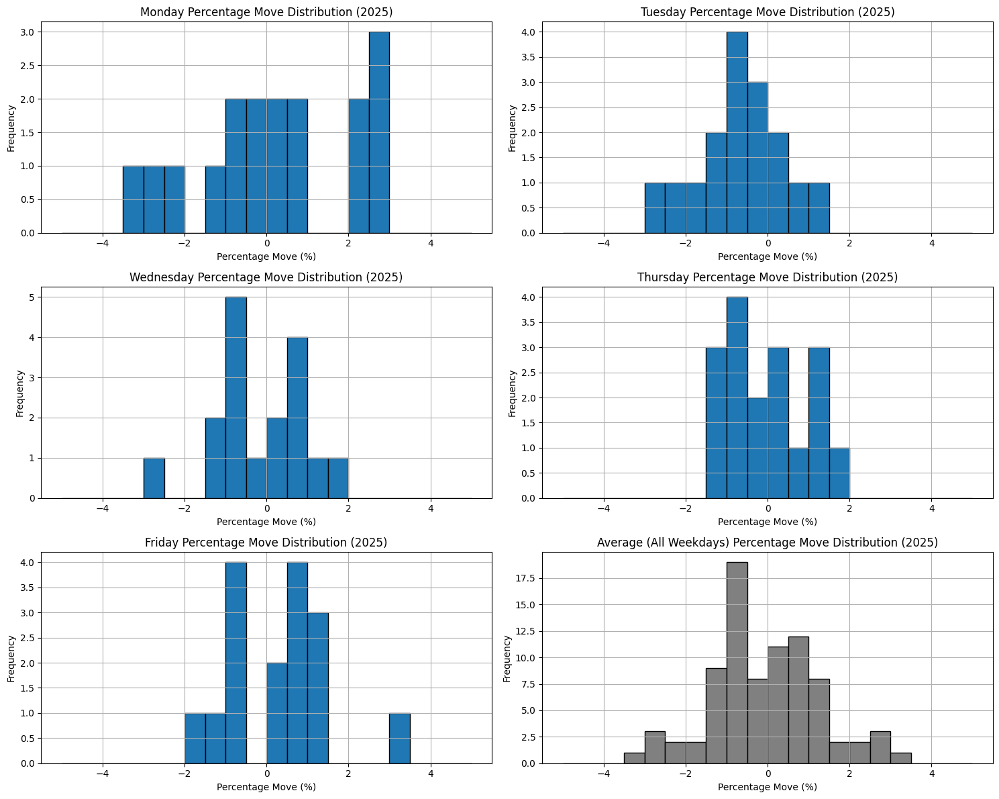

In [8]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from datetime import datetime
import pytz

# Load data (adjust path to your CSV file)
# Expected format: columns include 'timestamp' (UTC, e.g., '2024-01-01 00:00:00') and 'close' (price)
df = pd.read_csv('bitcoin_5min_coinbase_2025_data.csv')

# Convert timestamp to datetime and to New York time
df['timestamp'] = pd.to_datetime(df['timestamp'])
df['timestamp_ny'] = df['timestamp'].dt.tz_localize('UTC').dt.tz_convert('America/New_York')

# Extract date, time, and weekday
df['date'] = df['timestamp_ny'].dt.date
df['time'] = df['timestamp_ny'].dt.time
df['weekday'] = df['timestamp_ny'].dt.weekday

# Filter for weekdays (Monday=0, ..., Friday=4)
df = df[df['weekday'] < 5]

# Filter for 9:30 AM to 11:00 AM
start_time = pd.Timestamp('09:30:00').time()
end_time = pd.Timestamp('11:00:00').time()
df = df[(df['time'] >= start_time) & (df['time'] <= end_time)]

# Normalize prices to 1 at 9:30 AM each day
start_prices = df[df['time'] == start_time][['date', 'close']].rename(columns={'close': 'start_price'})
df = df.merge(start_prices, on='date', how='left')
df['normalized_price'] = df['close'] / df['start_price']

# Calculate percentage move from 9:30 AM to 11:00 AM for each day
daily_moves = df[df['time'] == end_time][['date', 'weekday', 'normalized_price']].rename(columns={'normalized_price': 'end_price'})
daily_moves['percent_move'] = (daily_moves['end_price'] - 1) * 100  # Convert to percentage

# Define weekday names and add 'Average' for all weekdays
weekday_names = {0: 'Monday', 1: 'Tuesday', 2: 'Wednesday', 3: 'Thursday', 4: 'Friday', 'average': 'Average (All Weekdays)'}

# Create bins for percentage moves (e.g., -5% to 5% in 0.5% increments)
bins = np.arange(-5, 5.5, 0.5)  # From -5% to 5% with 0.5% steps
bin_labels = [f"{x:.1f}%" for x in bins[:-1]]  # Labels for bins

# Initialize a dictionary to store histogram counts for each weekday and average
hist_data = {weekday_names[i]: np.histogram(daily_moves[daily_moves['weekday'] == i]['percent_move'], bins=bins)[0] for i in range(5)}
# Add average across all weekdays
hist_data[weekday_names['average']] = np.histogram(daily_moves['percent_move'], bins=bins)[0]

# Create a DataFrame for statistics
stats_df = pd.DataFrame(hist_data, index=bin_labels)

# Plot histograms for each weekday and average
plt.figure(figsize=(15, 12))
for i, (name, counts) in enumerate(hist_data.items()):
    plt.subplot(3, 2, i + 1)
    if name == 'Average (All Weekdays)':
        plt.hist(daily_moves['percent_move'], bins=bins, edgecolor='black', color='gray')
    else:
        plt.hist(daily_moves[daily_moves['weekday'] == list(weekday_names.keys())[i]]['percent_move'], bins=bins, edgecolor='black')
    plt.title(f'{name} Percentage Move Distribution (2025)')
    plt.xlabel('Percentage Move (%)')
    plt.ylabel('Frequency')
    plt.grid(True)
    plt.tight_layout()


# Display the plot
plt.show()

backtest

Loaded parsed_derivative_0dte_all_2024_q1.csv with 336290 rows
Found and processed aggressor column 'direction' in parsed_derivative_0dte_all_2024_q1.csv.
Loaded parsed_derivative_0dte_all_2024_q2.csv with 258052 rows
Found and processed aggressor column 'direction' in parsed_derivative_0dte_all_2024_q2.csv.
Loaded parsed_derivative_0dte_all_2024_q3.csv with 219311 rows
Found and processed aggressor column 'direction' in parsed_derivative_0dte_all_2024_q3.csv.
Loaded parsed_derivative_0dte_all_2024_q4.csv with 286527 rows
Found and processed aggressor column 'direction' in parsed_derivative_0dte_all_2024_q4.csv.
Loaded parsed_derivative_0dte_all_2025_jan_apr.csv with 377114 rows
Found and processed aggressor column 'direction' in parsed_derivative_0dte_all_2025_jan_apr.csv.

Merged dataset has 1477294 rows
Rows after dropping duplicates: 1367699
09:15-09:30 / 09:30-09:45 Trade on 2024-01-01: Capital = $9746.11, Net P/L = $-253.89
09:15-09:30 / 09:30-09:45 Trade on 2024-01-02: Capital =

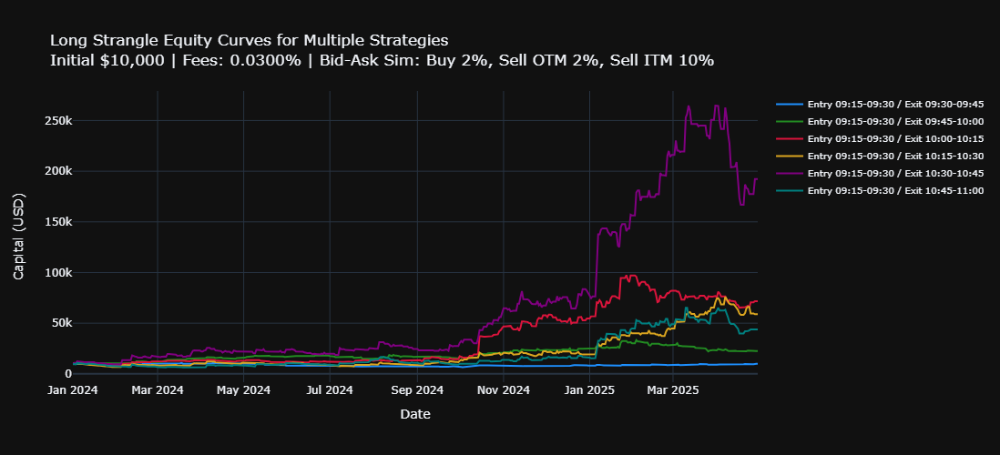


--- Performance Metrics for 09:15-09:30 / 09:30-09:45 ---

Failure Summary for 09:15-09:30 / 09:30-09:45:
No common OTM put strikes for entry and exit: 24 unique days (e.g., [datetime.date(2024, 1, 4), datetime.date(2024, 1, 9), datetime.date(2024, 1, 26)]...)
Weekend (no trading): 138 unique days (e.g., [datetime.date(2024, 1, 6), datetime.date(2024, 1, 7), datetime.date(2024, 1, 13)]...)
No common OTM call strikes for entry and exit: 24 unique days (e.g., [datetime.date(2024, 2, 5), datetime.date(2024, 2, 7), datetime.date(2024, 2, 26)]...)
Insufficient data points in entry/exit window: 9 unique days (e.g., [datetime.date(2024, 4, 23), datetime.date(2024, 7, 2), datetime.date(2024, 7, 22)]...)
Selected options not OTM at entry: 7 unique days (e.g., [datetime.date(2024, 4, 29), datetime.date(2024, 6, 14), datetime.date(2024, 8, 5)]...)
Calculated num_strangles is zero: 10 unique days (e.g., [datetime.date(2024, 11, 5), datetime.date(2024, 11, 18), datetime.date(2024, 11, 20)]...)
No 

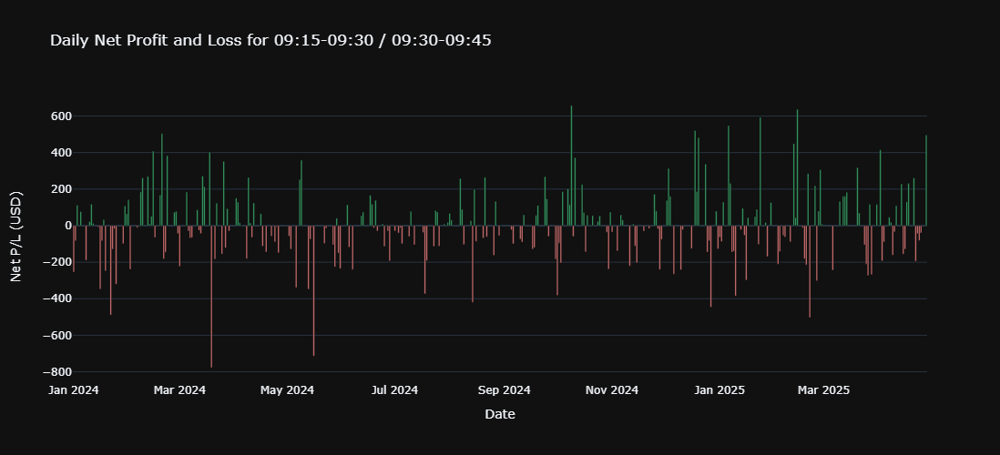

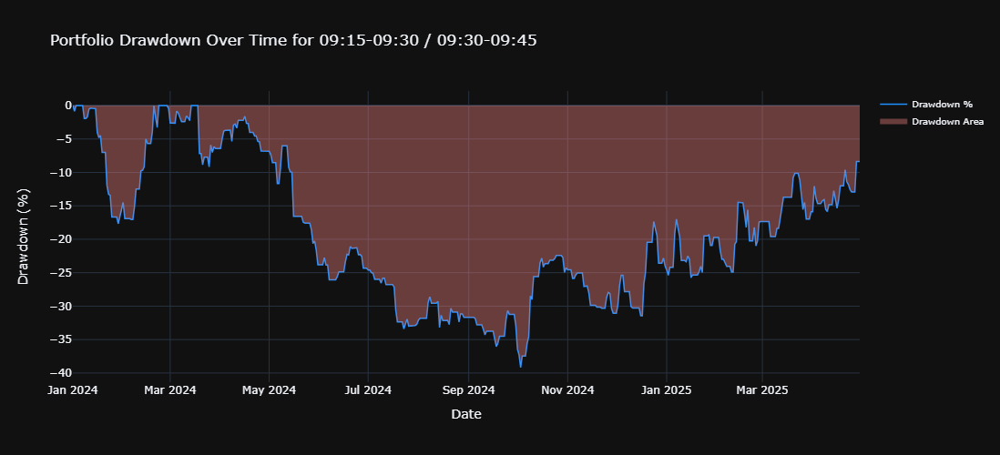


--- Performance Metrics for 09:15-09:30 / 09:45-10:00 ---

Failure Summary for 09:15-09:30 / 09:45-10:00:
Insufficient data points in entry/exit window: 11 unique days (e.g., [datetime.date(2024, 1, 1), datetime.date(2024, 4, 23), datetime.date(2024, 6, 19)]...)
No common OTM put strikes for entry and exit: 35 unique days (e.g., [datetime.date(2024, 1, 4), datetime.date(2024, 1, 25), datetime.date(2024, 1, 29)]...)
Weekend (no trading): 138 unique days (e.g., [datetime.date(2024, 1, 6), datetime.date(2024, 1, 7), datetime.date(2024, 1, 13)]...)
Selected options not OTM at entry: 7 unique days (e.g., [datetime.date(2024, 1, 10), datetime.date(2024, 4, 29), datetime.date(2024, 6, 14)]...)
No common OTM call strikes for entry and exit: 17 unique days (e.g., [datetime.date(2024, 3, 20), datetime.date(2024, 5, 6), datetime.date(2024, 5, 13)]...)
No data for date: 1 unique days (e.g., [datetime.date(2025, 4, 30)]...)

Equity curve for 09:15-09:30 / 09:45-10:00 has 486 data points (daily).
F

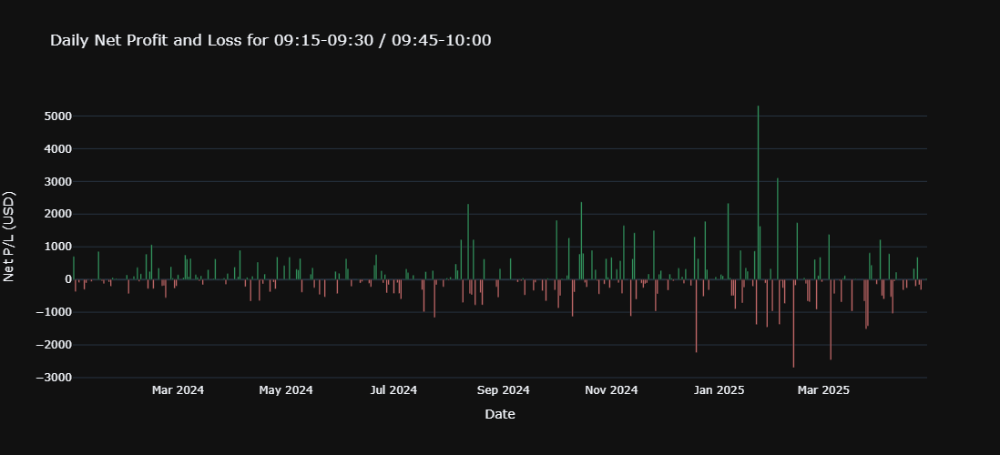

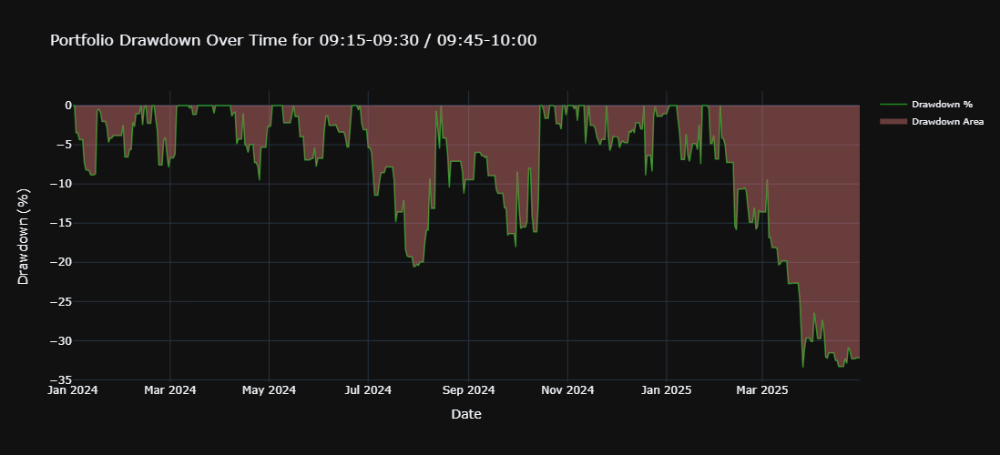


--- Performance Metrics for 09:15-09:30 / 10:00-10:15 ---

Failure Summary for 09:15-09:30 / 10:00-10:15:
Weekend (no trading): 138 unique days (e.g., [datetime.date(2024, 1, 6), datetime.date(2024, 1, 7), datetime.date(2024, 1, 13)]...)
Selected options not OTM at entry: 8 unique days (e.g., [datetime.date(2024, 1, 10), datetime.date(2024, 4, 16), datetime.date(2024, 4, 29)]...)
No common OTM put strikes for entry and exit: 31 unique days (e.g., [datetime.date(2024, 1, 24), datetime.date(2024, 1, 25), datetime.date(2024, 1, 26)]...)
Insufficient data points in entry/exit window: 10 unique days (e.g., [datetime.date(2024, 1, 30), datetime.date(2024, 4, 23), datetime.date(2024, 7, 2)]...)
No common OTM call strikes for entry and exit: 16 unique days (e.g., [datetime.date(2024, 1, 31), datetime.date(2024, 2, 6), datetime.date(2024, 3, 26)]...)
No data for date: 1 unique days (e.g., [datetime.date(2025, 4, 30)]...)

Equity curve for 09:15-09:30 / 10:00-10:15 has 486 data points (daily).


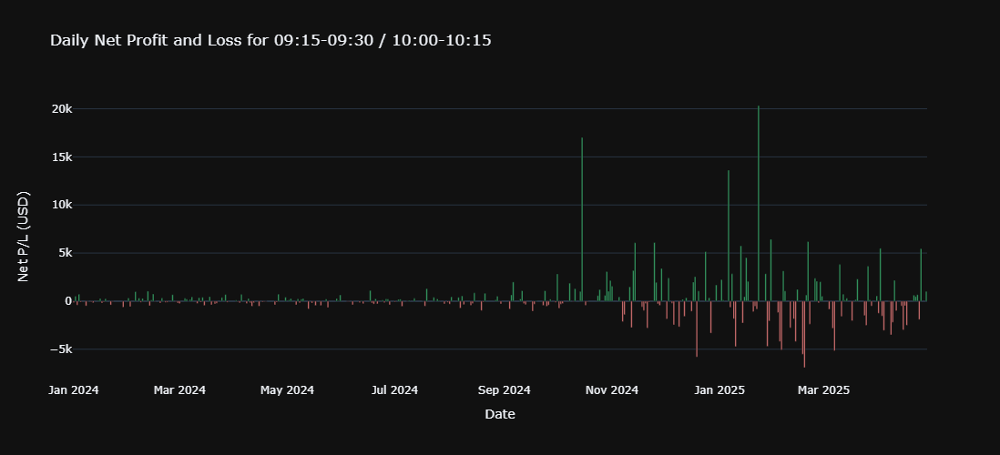

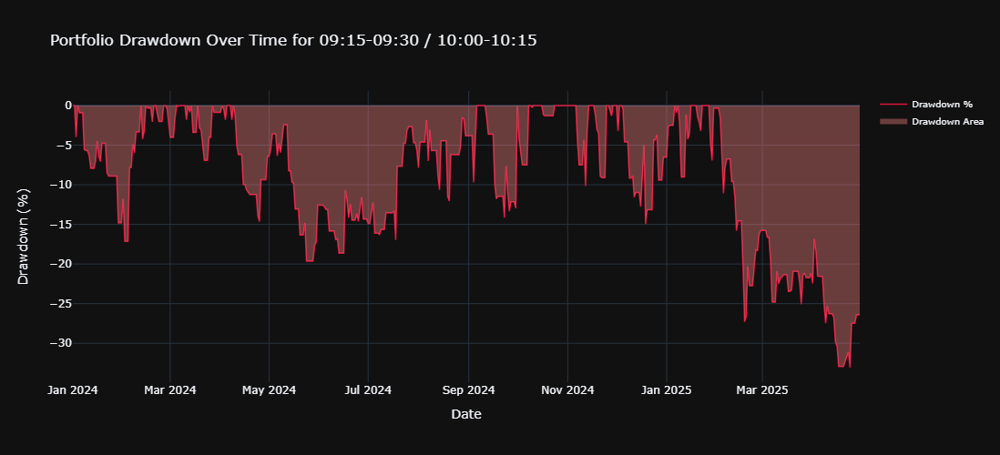


--- Performance Metrics for 09:15-09:30 / 10:15-10:30 ---

Failure Summary for 09:15-09:30 / 10:15-10:30:
No common OTM put strikes for entry and exit: 28 unique days (e.g., [datetime.date(2024, 1, 4), datetime.date(2024, 1, 30), datetime.date(2024, 1, 31)]...)
Weekend (no trading): 138 unique days (e.g., [datetime.date(2024, 1, 6), datetime.date(2024, 1, 7), datetime.date(2024, 1, 13)]...)
Selected options not OTM at entry: 5 unique days (e.g., [datetime.date(2024, 1, 10), datetime.date(2024, 2, 21), datetime.date(2024, 4, 29)]...)
No common OTM call strikes for entry and exit: 18 unique days (e.g., [datetime.date(2024, 2, 7), datetime.date(2024, 3, 6), datetime.date(2024, 4, 22)]...)
Calculated num_strangles is zero: 2 unique days (e.g., [datetime.date(2024, 3, 11), datetime.date(2024, 3, 13)]...)
Insufficient data points in entry/exit window: 10 unique days (e.g., [datetime.date(2024, 4, 23), datetime.date(2024, 5, 21), datetime.date(2024, 6, 10)]...)
No data for date: 1 unique day

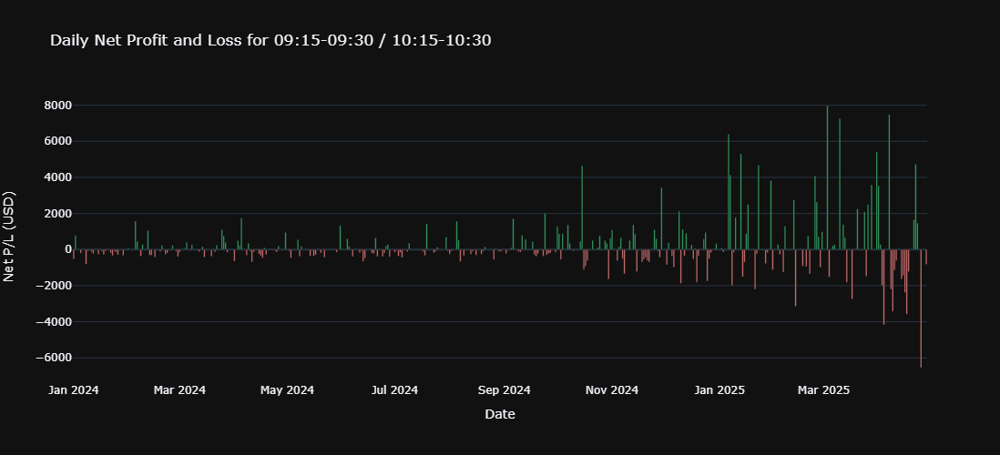

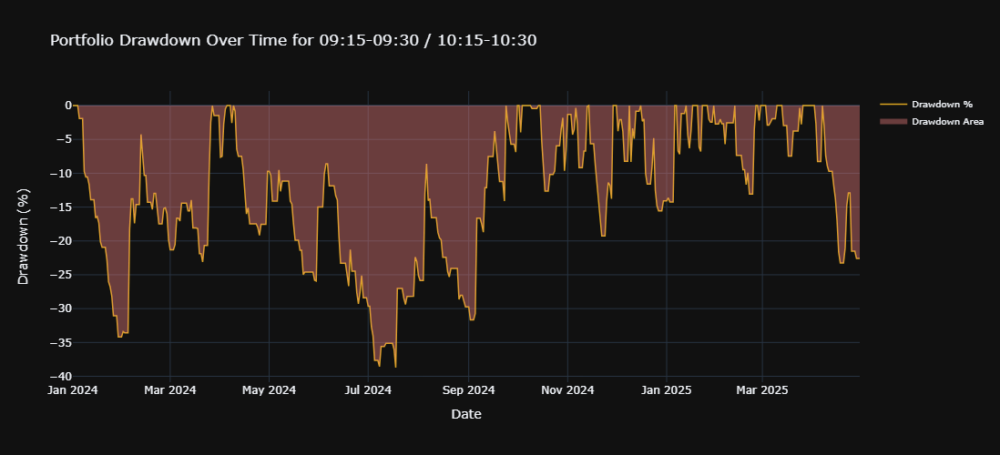


--- Performance Metrics for 09:15-09:30 / 10:30-10:45 ---

Failure Summary for 09:15-09:30 / 10:30-10:45:
Weekend (no trading): 138 unique days (e.g., [datetime.date(2024, 1, 6), datetime.date(2024, 1, 7), datetime.date(2024, 1, 13)]...)
Selected options not OTM at entry: 7 unique days (e.g., [datetime.date(2024, 1, 10), datetime.date(2024, 3, 21), datetime.date(2024, 4, 29)]...)
No common OTM put strikes for entry and exit: 33 unique days (e.g., [datetime.date(2024, 1, 18), datetime.date(2024, 1, 26), datetime.date(2024, 1, 31)]...)
No common OTM call strikes for entry and exit: 28 unique days (e.g., [datetime.date(2024, 1, 30), datetime.date(2024, 2, 9), datetime.date(2024, 2, 19)]...)
Insufficient data points in entry/exit window: 8 unique days (e.g., [datetime.date(2024, 4, 23), datetime.date(2024, 7, 2), datetime.date(2024, 7, 22)]...)
No data for date: 1 unique days (e.g., [datetime.date(2025, 4, 30)]...)

Equity curve for 09:15-09:30 / 10:30-10:45 has 486 data points (daily).
F

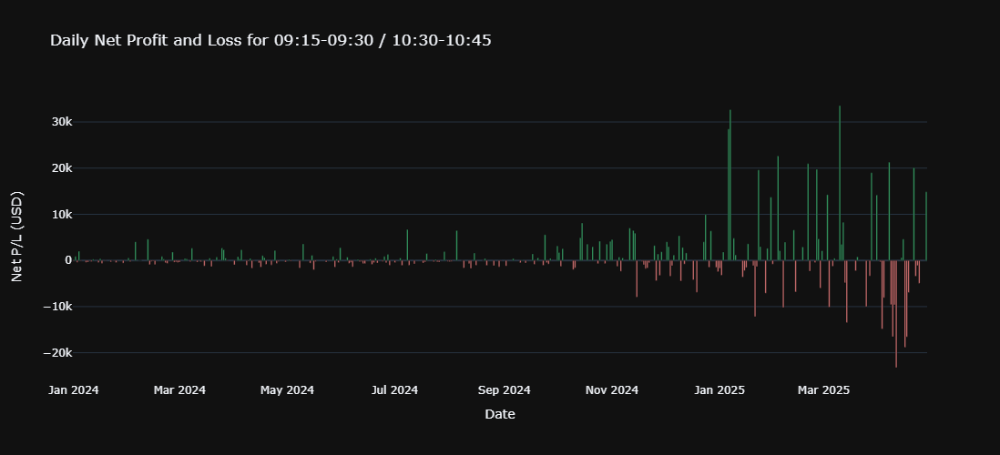

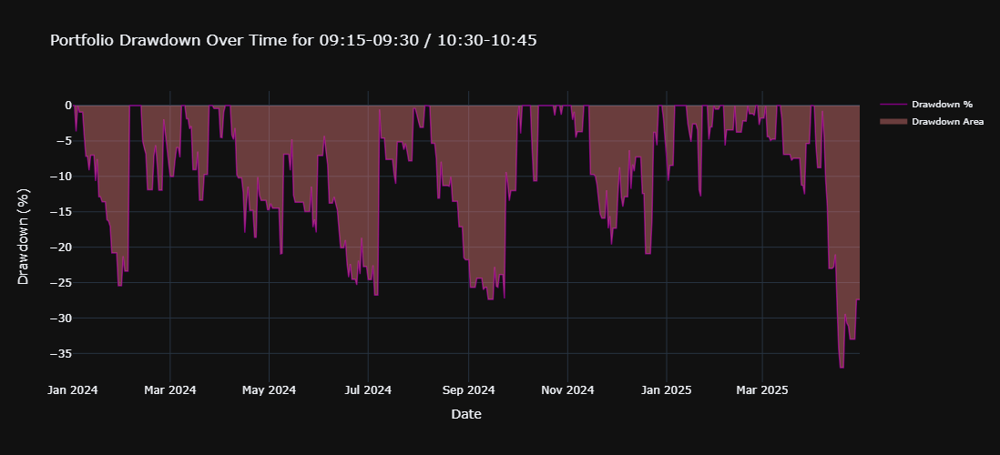


--- Performance Metrics for 09:15-09:30 / 10:45-11:00 ---

Failure Summary for 09:15-09:30 / 10:45-11:00:
No common OTM call strikes for entry and exit: 25 unique days (e.g., [datetime.date(2024, 1, 2), datetime.date(2024, 2, 5), datetime.date(2024, 2, 6)]...)
Weekend (no trading): 138 unique days (e.g., [datetime.date(2024, 1, 6), datetime.date(2024, 1, 7), datetime.date(2024, 1, 13)]...)
No common OTM put strikes for entry and exit: 43 unique days (e.g., [datetime.date(2024, 1, 24), datetime.date(2024, 1, 31), datetime.date(2024, 2, 19)]...)
Calculated num_strangles is zero: 6 unique days (e.g., [datetime.date(2024, 2, 28), datetime.date(2024, 3, 11), datetime.date(2024, 3, 21)]...)
Insufficient data points in entry/exit window: 9 unique days (e.g., [datetime.date(2024, 4, 23), datetime.date(2024, 7, 2), datetime.date(2024, 7, 22)]...)
Selected options not OTM at entry: 3 unique days (e.g., [datetime.date(2024, 6, 14), datetime.date(2024, 12, 6), datetime.date(2025, 3, 11)]...)
No d

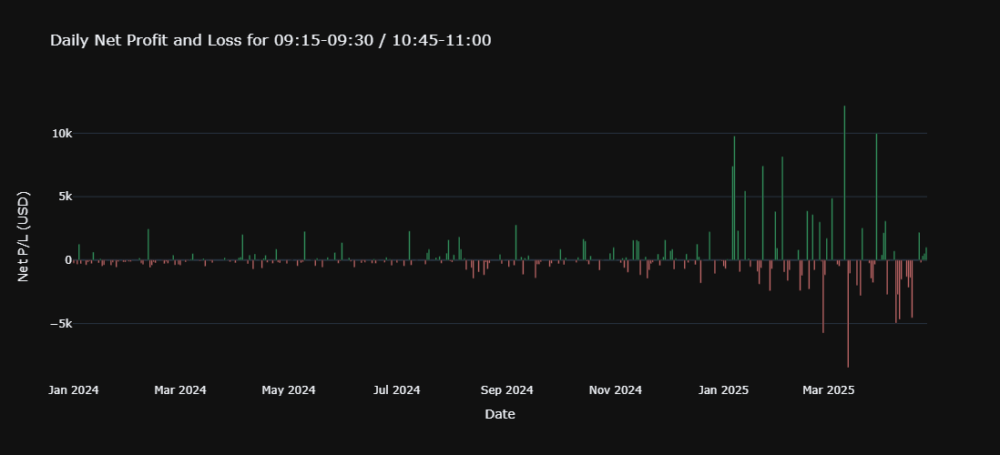

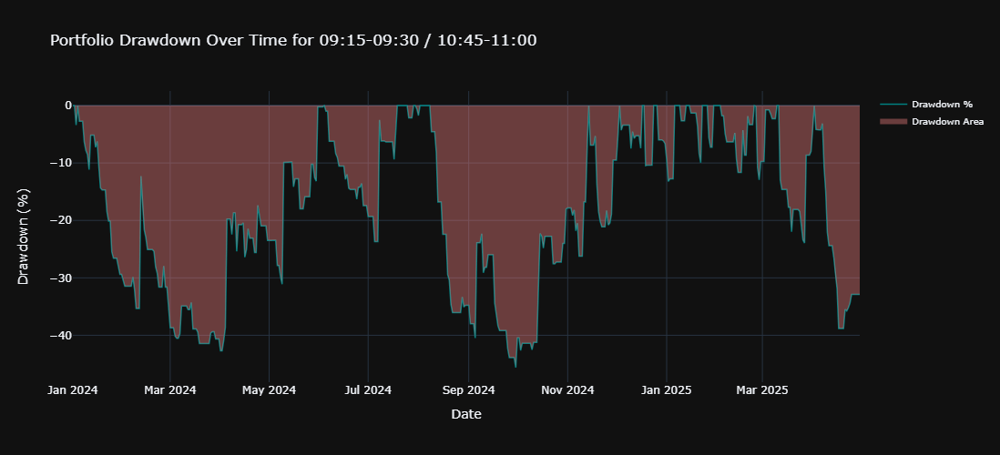


Backtest finished.


In [9]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from math import floor
from datetime import datetime, timedelta
from zoneinfo import ZoneInfo
import uuid

# --- CONFIGURATION ---
AGGRESSOR_SIDE_COLUMN_NAME = 'direction'

# List of data files
files = [
    'parsed_derivative_0dte_all_2024_q1.csv',
    'parsed_derivative_0dte_all_2024_q2.csv',
    'parsed_derivative_0dte_all_2024_q3.csv',
    'parsed_derivative_0dte_all_2024_q4.csv',
    'parsed_derivative_0dte_all_2025_jan_apr.csv'
]

# Define strategies with time-based labels
strategies = [
    {'name': '09:15-09:30 / 09:30-09:45', 'entry_start': '09:15', 'entry_end': '09:30', 'exit_start': '09:30', 'exit_end': '09:45', 'color': 'dodgerblue'},
    {'name': '09:15-09:30 / 09:45-10:00', 'entry_start': '09:15', 'entry_end': '09:30', 'exit_start': '09:45', 'exit_end': '10:00', 'color': 'forestgreen'},
    {'name': '09:15-09:30 / 10:00-10:15', 'entry_start': '09:15', 'entry_end': '09:30', 'exit_start': '10:00', 'exit_end': '10:15', 'color': 'crimson'},
    {'name': '09:15-09:30 / 10:15-10:30', 'entry_start': '09:15', 'entry_end': '09:30', 'exit_start': '10:15', 'exit_end': '10:30', 'color': 'goldenrod'},
    {'name': '09:15-09:30 / 10:30-10:45', 'entry_start': '09:15', 'entry_end': '09:30', 'exit_start': '10:30', 'exit_end': '10:45', 'color': 'purple'},
    {'name': '09:15-09:30 / 10:45-11:00', 'entry_start': '09:15', 'entry_end': '09:30', 'exit_start': '10:45', 'exit_end': '11:00', 'color': 'teal'}
]

# Load and merge datasets
dfs = []
for file in files:
    try:
        df = pd.read_csv(file)
        print(f"Loaded {file} with {len(df)} rows")
        df['date_time'] = pd.to_datetime(df['date_time'], format='ISO8601', utc=True, errors='coerce')
        df = df.dropna(subset=['date_time'])

        if AGGRESSOR_SIDE_COLUMN_NAME not in df.columns:
            print(f"CRITICAL ERROR: Column '{AGGRESSOR_SIDE_COLUMN_NAME}' not found in {file}. Please check column name or data.")
            exit()
        else:
            if pd.api.types.is_string_dtype(df[AGGRESSOR_SIDE_COLUMN_NAME]):
                df[AGGRESSOR_SIDE_COLUMN_NAME] = df[AGGRESSOR_SIDE_COLUMN_NAME].str.lower().str.strip()
            else:
                df[AGGRESSOR_SIDE_COLUMN_NAME] = df[AGGRESSOR_SIDE_COLUMN_NAME].astype(str).str.lower().str.strip()
            print(f"Found and processed aggressor column '{AGGRESSOR_SIDE_COLUMN_NAME}' in {file}.")

        dfs.append(df)
    except FileNotFoundError:
        print(f"Error: '{file}' not found. Please check the file path.")

if not dfs:
    print("No data files were successfully loaded. Exiting.")
    exit()

merged_df = pd.concat(dfs, ignore_index=True)
print(f"\nMerged dataset has {len(merged_df)} rows")

key_columns = ['date_time', 'index_price', 'strike', 'price', 'option_type', AGGRESSOR_SIDE_COLUMN_NAME]
existing_key_columns = [col for col in key_columns if col in merged_df.columns]
merged_df = merged_df.drop_duplicates(subset=existing_key_columns, keep='first')
print(f"Rows after dropping duplicates: {len(merged_df)}")

merged_df['date_time'] = merged_df['date_time'].dt.tz_convert('US/Eastern')
merged_df = merged_df.sort_values('date_time').reset_index(drop=True)
merged_df.set_index('date_time', inplace=True)
daily_dfs = {date: group for date, group in merged_df.groupby(merged_df.index.date)}

initial_capital = 10000
otm_percentage = 0.01
min_data_points = 5
fee_rate = 0.0003
bid_ask_spread_buy = 0.02  # 2% spread for buying
bid_ask_spread_sell_otm = 0.02  # 2% spread for selling OTM
bid_ask_spread_sell_itm = 0.10  # 10% spread for selling ITM

def classify_moneyness(strike, index_price, option_type):
    if option_type == 'call':
        return 'otm' if strike > index_price else 'itm'
    elif option_type == 'put':
        return 'otm' if strike < index_price else 'itm'
    return None

def get_adjusted_price(price, data_aggressor_side, strategy_action, moneyness=None):
    data_aggressor_side = str(data_aggressor_side).lower()
    if strategy_action == 'buy':
        if data_aggressor_side == 'buy':
            return price
        elif data_aggressor_side == 'sell':
            return price * (1 + bid_ask_spread_buy)
        else:
            return price * (1 + bid_ask_spread_buy)
    elif strategy_action == 'sell':
        spread = bid_ask_spread_sell_otm if moneyness == 'otm' else bid_ask_spread_sell_itm
        if data_aggressor_side == 'sell':
            return price
        elif data_aggressor_side == 'buy':
            return max(0, price * (1 - spread))
        else:
            return max(0, price * (1 - spread))
    return price

# Store equity curves and trades for each strategy
strategy_equity_curves = {s['name']: [] for s in strategies}
strategy_trades = {s['name']: [] for s in strategies}
strategy_failure_reasons = {s['name']: {} for s in strategies}

start_date_dt = datetime(2024, 1, 1, tzinfo=ZoneInfo('US/Eastern'))
end_date_dt = datetime(2025, 4, 30, tzinfo=ZoneInfo('US/Eastern'))
current_date_dt = start_date_dt

for strategy in strategies:
    capital = initial_capital
    start_sim_date = datetime(2024, 1, 1, tzinfo=ZoneInfo('US/Eastern')).date()
    equity_curve_daily = [(start_sim_date, initial_capital)]
    trades = []
    failure_reasons = {}
    current_date_dt = start_date_dt

    while current_date_dt <= end_date_dt:
        date_key = current_date_dt.date()
        if equity_curve_daily and equity_curve_daily[-1][0] != date_key:
            last_recorded_date = equity_curve_daily[-1][0]
            days_to_fill = (date_key - last_recorded_date).days
            if days_to_fill > 0:
                fill_date = last_recorded_date
                for _ in range(days_to_fill):
                    fill_date += timedelta(days=1)
                    if fill_date < date_key:
                        equity_curve_daily.append((fill_date, equity_curve_daily[-1][1]))
            if not equity_curve_daily or equity_curve_daily[-1][0] != date_key:
                equity_curve_daily.append((date_key, capital))

        if current_date_dt.weekday() >= 5:
            failure_reasons.setdefault('Weekend (no trading)', []).append(date_key)
            current_date_dt += timedelta(days=1)
            continue

        if date_key not in daily_dfs:
            failure_reasons.setdefault('No data for date', []).append(date_key)
            current_date_dt += timedelta(days=1)
            continue

        daily_df = daily_dfs[date_key]

        # Set strategy-specific times
        entry_start_time = datetime(date_key.year, date_key.month, date_key.day, int(strategy['entry_start'].split(':')[0]), int(strategy['entry_start'].split(':')[1]), 0, tzinfo=ZoneInfo('US/Eastern'))
        entry_end_time = datetime(date_key.year, date_key.month, date_key.day, int(strategy['entry_end'].split(':')[0]), int(strategy['entry_end'].split(':')[1]), 0, tzinfo=ZoneInfo('US/Eastern'))
        exit_start_time = datetime(date_key.year, date_key.month, date_key.day, int(strategy['exit_start'].split(':')[0]), int(strategy['exit_start'].split(':')[1]), 0, tzinfo=ZoneInfo('US/Eastern'))
        exit_end_time = datetime(date_key.year, date_key.month, date_key.day, int(strategy['exit_end'].split(':')[0]), int(strategy['exit_end'].split(':')[1]), 0, tzinfo=ZoneInfo('US/Eastern'))

        entry_df = daily_df[(daily_df.index >= entry_start_time) & (daily_df.index <= entry_end_time)]
        exit_df = daily_df[(daily_df.index >= exit_start_time) & (daily_df.index <= exit_end_time)]

        if len(entry_df) < min_data_points or len(exit_df) < min_data_points:
            failure_reasons.setdefault('Insufficient data points in entry/exit window', []).append(date_key)
            current_date_dt += timedelta(days=1)
            continue

        index_price_for_strike_selection = entry_df['index_price'].iloc[0]

        # Call options
        call_strikes_entry_df = entry_df[(entry_df['option_type'] == 'call') & (entry_df['strike'] > index_price_for_strike_selection)]
        call_strikes_exit_df = exit_df[(exit_df['option_type'] == 'call') & (exit_df['strike'] > index_price_for_strike_selection)]
        common_call_strikes = np.intersect1d(call_strikes_entry_df['strike'].unique(), call_strikes_exit_df['strike'].unique())
        if len(common_call_strikes) == 0:
            failure_reasons.setdefault('No common OTM call strikes for entry and exit', []).append(date_key)
            current_date_dt += timedelta(days=1)
            continue
        call_otm_diffs = np.abs((common_call_strikes - index_price_for_strike_selection) / index_price_for_strike_selection - otm_percentage)
        selected_call_strike = common_call_strikes[np.argmin(call_otm_diffs)]

        # Put options
        put_strikes_entry_df = entry_df[(entry_df['option_type'] == 'put') & (entry_df['strike'] < index_price_for_strike_selection)]
        put_strikes_exit_df = exit_df[(exit_df['option_type'] == 'put') & (exit_df['strike'] < index_price_for_strike_selection)]
        common_put_strikes = np.intersect1d(put_strikes_entry_df['strike'].unique(), put_strikes_exit_df['strike'].unique())
        if len(common_put_strikes) == 0:
            failure_reasons.setdefault('No common OTM put strikes for entry and exit', []).append(date_key)
            current_date_dt += timedelta(days=1)
            continue
        put_otm_diffs = np.abs((index_price_for_strike_selection - common_put_strikes) / index_price_for_strike_selection - otm_percentage)
        selected_put_strike = common_put_strikes[np.argmin(put_otm_diffs)]

        call_entry_options_all_info = entry_df[(entry_df['option_type'] == 'call') & (entry_df['strike'] == selected_call_strike)]
        put_entry_options_all_info = entry_df[(entry_df['option_type'] == 'put') & (entry_df['strike'] == selected_put_strike)]
        if call_entry_options_all_info.empty or put_entry_options_all_info.empty:
            failure_reasons.setdefault('No entry options data for selected strikes', []).append(date_key)
            current_date_dt += timedelta(days=1)
            continue

        call_entry_data_point = call_entry_options_all_info.iloc[0]
        put_entry_data_point = put_entry_options_all_info.iloc[0]

        raw_call_entry_price_btc = call_entry_data_point['price']
        call_data_aggressor_entry = call_entry_data_point[AGGRESSOR_SIDE_COLUMN_NAME]
        adjusted_call_entry_price_btc = get_adjusted_price(raw_call_entry_price_btc, call_data_aggressor_entry, 'buy')

        raw_put_entry_price_btc = put_entry_data_point['price']
        put_data_aggressor_entry = put_entry_data_point[AGGRESSOR_SIDE_COLUMN_NAME]
        adjusted_put_entry_price_btc = get_adjusted_price(raw_put_entry_price_btc, put_data_aggressor_entry, 'buy')

        call_entry_timestamp = call_entry_data_point.name
        put_entry_timestamp = put_entry_data_point.name
        index_price_at_call_entry = call_entry_data_point['index_price']
        index_price_at_put_entry = put_entry_data_point['index_price']

        if classify_moneyness(selected_call_strike, index_price_at_call_entry, 'call') != 'otm' or \
           classify_moneyness(selected_put_strike, index_price_at_put_entry, 'put') != 'otm':
            failure_reasons.setdefault('Selected options not OTM at entry', []).append(date_key)
            current_date_dt += timedelta(days=1)
            continue

        call_leg_entry_cost_usd_per_contract = adjusted_call_entry_price_btc * index_price_at_call_entry
        put_leg_entry_cost_usd_per_contract = adjusted_put_entry_price_btc * index_price_at_put_entry
        cost_per_strangle_usd_no_fees = call_leg_entry_cost_usd_per_contract + put_leg_entry_cost_usd_per_contract

        if cost_per_strangle_usd_no_fees <= 1e-9:
            failure_reasons.setdefault('Invalid or near-zero cost per strangle (<=0 USD)', []).append(date_key)
            current_date_dt += timedelta(days=1)
            continue

        target_allocation = capital * 0.20
        num_strangles = floor(target_allocation / cost_per_strangle_usd_no_fees)

        if num_strangles == 0:
            failure_reasons.setdefault('Calculated num_strangles is zero', []).append(date_key)
            current_date_dt += timedelta(days=1)
            continue

        total_entry_cost_usd_before_fees = num_strangles * cost_per_strangle_usd_no_fees
        
        call_leg_total_value_entry_usd = num_strangles * call_leg_entry_cost_usd_per_contract
        put_leg_total_value_entry_usd = num_strangles * put_leg_entry_cost_usd_per_contract
        
        call_entry_fees_usd = call_leg_total_value_entry_usd * fee_rate
        put_entry_fees_usd = put_leg_total_value_entry_usd * fee_rate
        total_entry_fees_usd = call_entry_fees_usd + put_entry_fees_usd
        total_entry_debit_usd = total_entry_cost_usd_before_fees + total_entry_fees_usd

        if total_entry_debit_usd > capital:
            failure_reasons.setdefault('Insufficient capital for trade (debit + fees)', []).append(date_key)
            current_date_dt += timedelta(days=1)
            continue

        # --- EXIT LOGIC ---
        call_exit_options_all_info = exit_df[(exit_df['option_type'] == 'call') & (exit_df['strike'] == selected_call_strike)]
        put_exit_options_all_info = exit_df[(exit_df['option_type'] == 'put') & (exit_df['strike'] == selected_put_strike)]
        if call_exit_options_all_info.empty or put_exit_options_all_info.empty:
            failure_reasons.setdefault('No exit options data for selected strikes', []).append(date_key)
            current_date_dt += timedelta(days=1)
            continue

        call_exit_data_point = call_exit_options_all_info.iloc[0]
        put_exit_data_point = put_exit_options_all_info.iloc[0]

        # Determine moneyness at exit
        call_moneyness_exit = classify_moneyness(selected_call_strike, call_exit_data_point['index_price'], 'call')
        put_moneyness_exit = classify_moneyness(selected_put_strike, put_exit_data_point['index_price'], 'put')

        raw_call_exit_price_btc = call_exit_data_point['price']
        call_data_aggressor_exit = call_exit_data_point[AGGRESSOR_SIDE_COLUMN_NAME]
        adjusted_call_exit_price_btc = get_adjusted_price(raw_call_exit_price_btc, call_data_aggressor_exit, 'sell', call_moneyness_exit)

        raw_put_exit_price_btc = put_exit_data_point['price']
        put_data_aggressor_exit = put_exit_data_point[AGGRESSOR_SIDE_COLUMN_NAME]
        adjusted_put_exit_price_btc = get_adjusted_price(raw_put_exit_price_btc, put_data_aggressor_exit, 'sell', put_moneyness_exit)

        call_exit_timestamp = call_exit_data_point.name
        put_exit_timestamp = put_exit_data_point.name
        index_price_at_call_exit = call_exit_data_point['index_price']
        index_price_at_put_exit = put_exit_data_point['index_price']

        call_leg_exit_value_usd_per_contract = adjusted_call_exit_price_btc * index_price_at_call_exit
        put_leg_exit_value_usd_per_contract = adjusted_put_exit_price_btc * index_price_at_put_exit
        total_exit_value_usd_before_fees = num_strangles * (call_leg_exit_value_usd_per_contract + put_leg_exit_value_usd_per_contract)

        call_leg_total_value_exit_usd = num_strangles * call_leg_exit_value_usd_per_contract
        put_leg_total_value_exit_usd = num_strangles * put_leg_exit_value_usd_per_contract
        call_exit_fees_usd = call_leg_total_value_exit_usd * fee_rate
        put_exit_fees_usd = put_leg_total_value_exit_usd * fee_rate
        total_exit_fees_usd = call_exit_fees_usd + put_exit_fees_usd
        total_exit_credit_usd = total_exit_value_usd_before_fees - total_exit_fees_usd

        gross_pl_usd = total_exit_value_usd_before_fees - total_entry_cost_usd_before_fees
        total_fees_for_trade = total_entry_fees_usd + total_exit_fees_usd
        net_pl_usd = gross_pl_usd - total_fees_for_trade

        capital += net_pl_usd

        trades.append({
            'Date': date_key,
            'Entry_Timestamp_Call': call_entry_timestamp,
            'Entry_Timestamp_Put': put_entry_timestamp,
            'Exit_Timestamp_Call': call_exit_timestamp,
            'Exit_Timestamp_Put': put_exit_timestamp,
            'Capital_End_Day': capital,
            'P/L_USD_Net': net_pl_usd,
            'P/L_USD_Gross': gross_pl_usd,
            'Num_Strangles': num_strangles,
            'Index_Price_Entry_Call': index_price_at_call_entry,
            'Index_Price_Entry_Put': index_price_at_put_entry,
            'Entry_Strike_Call': selected_call_strike,
            'Exit_Strike_Call': selected_call_strike,
            'Entry_Strike_Put': selected_put_strike,
            'Exit_Strike_Put': selected_put_strike,
            'Total_Fees_Trade_USD': total_fees_for_trade,
            'Call_Price_BTC_Entry_Raw': raw_call_entry_price_btc,
            'Call_Price_BTC_Entry_Adjusted': adjusted_call_entry_price_btc,
            'Put_Price_BTC_Entry_Raw': raw_put_entry_price_btc,
            'Put_Price_BTC_Entry_Adjusted': adjusted_put_entry_price_btc,
            'Index_Price_Exit_Call': index_price_at_call_exit,
            'Index_Price_Exit_Put': index_price_at_put_exit,
            'Call_Price_BTC_Exit_Raw': raw_call_exit_price_btc,
            'Call_Price_BTC_Exit_Adjusted': adjusted_call_exit_price_btc,
            'Put_Price_BTC_Exit_Raw': raw_put_exit_price_btc,
            'Put_Price_BTC_Exit_Adjusted': adjusted_put_exit_price_btc,
            'Cost_Per_Strangle_USD_Entry_NoFees': cost_per_strangle_usd_no_fees,
            'Total_Entry_Debit_USD': total_entry_debit_usd,
            'Total_Exit_Credit_USD': total_exit_credit_usd,
            'Call_Entry_Fees_USD': call_entry_fees_usd,
            'Put_Entry_Fees_USD': put_entry_fees_usd,
            'Total_Entry_Fees_USD': total_entry_fees_usd,
            'Call_Exit_Fees_USD': call_exit_fees_usd,
            'Put_Exit_Fees_USD': put_exit_fees_usd,
            'Total_Exit_Fees_USD': total_exit_fees_usd,
            'Call_Aggressor_Entry': call_data_aggressor_entry,
            'Put_Aggressor_Entry': put_data_aggressor_entry,
            'Call_Aggressor_Exit': call_data_aggressor_exit,
            'Put_Aggressor_Exit': put_data_aggressor_exit,
            'Call_Moneyness_Exit': call_moneyness_exit,
            'Put_Moneyness_Exit': put_moneyness_exit,
        })

        print(f"{strategy['name']} Trade on {date_key}: Capital = ${capital:.2f}, Net P/L = ${net_pl_usd:.2f}")

        if equity_curve_daily and equity_curve_daily[-1][0] == date_key:
            equity_curve_daily[-1] = (date_key, capital)

        current_date_dt += timedelta(days=1)

    # Fill equity curve up to the last day
    final_sim_day_processed = current_date_dt.date() - timedelta(days=1)
    if equity_curve_daily:
        last_equity_date_in_curve = equity_curve_daily[-1][0]
        current_fill_date = last_equity_date_in_curve
        while current_fill_date < final_sim_day_processed:
            current_fill_date += timedelta(days=1)
            if not equity_curve_daily or equity_curve_daily[-1][0] < current_fill_date:
                equity_curve_daily.append((current_fill_date, equity_curve_daily[-1][1]))
        if equity_curve_daily[-1][0] == final_sim_day_processed:
            equity_curve_daily[-1] = (final_sim_day_processed, capital)

    strategy_equity_curves[strategy['name']] = pd.DataFrame(equity_curve_daily, columns=['Date', 'Capital'])
    strategy_trades[strategy['name']] = pd.DataFrame(trades)
    strategy_failure_reasons[strategy['name']] = failure_reasons

    if not strategy_equity_curves[strategy['name']].empty:
        strategy_equity_curves[strategy['name']]['Date'] = pd.to_datetime(strategy_equity_curves[strategy['name']]['Date'])
        strategy_equity_curves[strategy['name']] = strategy_equity_curves[strategy['name']].drop_duplicates(subset='Date', keep='last').sort_values(by='Date').reset_index(drop=True)

# Plotting and Performance Metrics
# Plot 1: Combined Equity Curves
fig = go.Figure()
for strategy in strategies:
    equity_df = strategy_equity_curves[strategy['name']]
    if not equity_df.empty:
        fig.add_trace(
            go.Scatter(
                x=equity_df['Date'],
                y=equity_df['Capital'],
                mode='lines',
                name=f"Entry {strategy['entry_start']}-{strategy['entry_end']} / Exit {strategy['exit_start']}-{strategy['exit_end']}",
                line=dict(color=strategy['color'], width=2)
            )
        )
fig.update_layout(
    title=f'Long Strangle Equity Curves for Multiple Strategies<br>Initial ${initial_capital:,.0f} | Fees: {fee_rate*100:.4f}% | Bid-Ask Sim: Buy {bid_ask_spread_buy*100:.0f}%, Sell OTM {bid_ask_spread_sell_otm*100:.0f}%, Sell ITM {bid_ask_spread_sell_itm*100:.0f}%',
    xaxis_title='Date',
    yaxis_title='Capital (USD)',
    legend=dict(font=dict(size=10)),
    template='plotly_dark',
    width=1000,
    height=500
)
fig.show()

# Process metrics and plots for each strategy
for strategy in strategies:
    print(f"\n--- Performance Metrics for {strategy['name']} ---")
    equity_df = strategy_equity_curves[strategy['name']]
    trades_df = strategy_trades[strategy['name']]
    failure_reasons = strategy_failure_reasons[strategy['name']]

    if failure_reasons:
        print(f"\nFailure Summary for {strategy['name']}:")
        for reason, dates_list in failure_reasons.items():
            unique_dates = sorted(list(set(dates_list)))
            print(f"{reason}: {len(unique_dates)} unique days (e.g., {unique_dates[:3]}...)")

    if not equity_df.empty:
        print(f"\nEquity curve for {strategy['name']} has {len(equity_df)} data points (daily).")
        print(f"First few entries:\n{equity_df.head()}")
        print(f"Last few entries:\n{equity_df.tail()}")

    if not trades_df.empty:
        total_net_pl = trades_df['P/L_USD_Net'].sum()
        num_trades = len(trades_df)
        winning_trades = trades_df[trades_df['P/L_USD_Net'] > 1e-9]
        losing_trades = trades_df[trades_df['P/L_USD_Net'] < -1e-9]
        breakeven_trades = trades_df[(trades_df['P/L_USD_Net'] >= -1e-9) & (trades_df['P/L_USD_Net'] <= 1e-9)]
        num_wins = len(winning_trades)
        num_losses = len(losing_trades)
        num_breakeven = len(breakeven_trades)

        win_rate = (num_wins / num_trades) * 100 if num_trades > 0 else 0
        avg_win = winning_trades['P/L_USD_Net'].mean() if num_wins > 0 else 0
        avg_loss = losing_trades['P/L_USD_Net'].mean() if num_losses > 0 else 0
        
        sum_of_wins = winning_trades['P/L_USD_Net'].sum()
        sum_of_losses_abs = abs(losing_trades['P/L_USD_Net'].sum())
        profit_factor = sum_of_wins / sum_of_losses_abs if sum_of_losses_abs > 1e-9 else float('inf') if sum_of_wins > 1e-9 else 0

        print(f"Initial Capital: ${initial_capital:.2f}")
        final_capital_from_equity = equity_df['Capital'].iloc[-1] if not equity_df.empty else capital
        print(f"Final Capital: ${final_capital_from_equity:.2f}")
        print(f"Total Net P/L: ${total_net_pl:.2f}")
        print(f"Total Trades: {num_trades}")
        print(f"Win Rate: {win_rate:.2f}% ({num_wins} wins / {num_losses} losses / {num_breakeven} breakeven)")
        print(f"Average Win: ${avg_win:.2f}")
        print(f"Average Loss: ${avg_loss:.2f}")
        print(f"Profit Factor: {profit_factor:.2f}")
        
        if 'Total_Fees_Trade_USD' in trades_df.columns:
            total_fees_paid_overall = trades_df['Total_Fees_Trade_USD'].sum()
            print(f"Total Fees Paid: ${total_fees_paid_overall:.2f}")

        equity_df['Capital'] = pd.to_numeric(equity_df['Capital'], errors='coerce')
        equity_df['Daily_Return'] = equity_df['Capital'].pct_change().fillna(0)
        
        sharpe_ratio = 0
        sortino_ratio = 0
        if len(equity_df['Daily_Return']) > 1:
            avg_daily_return = equity_df['Daily_Return'].mean()
            std_daily_return = equity_df['Daily_Return'].std()
            if std_daily_return is not None and std_daily_return != 0 and not np.isnan(std_daily_return):
                sharpe_ratio = (avg_daily_return / std_daily_return) * np.sqrt(252)
            
            negative_returns_series = equity_df.loc[equity_df['Daily_Return'] < 0, 'Daily_Return']
            downside_std = 0
            if not negative_returns_series.empty and len(negative_returns_series) > 1:
                downside_std = negative_returns_series.std()
            
            if downside_std is not None and downside_std != 0 and not np.isnan(downside_std):
                sortino_ratio = (avg_daily_return / downside_std) * np.sqrt(252)
            elif avg_daily_return > 0:
                sortino_ratio = float('inf')
            
        print(f"Annualized Sharpe Ratio (Rf=0%): {sharpe_ratio:.2f}")
        print(f"Annualized Sortino Ratio (Rf=0%, Target=0%): {sortino_ratio:.2f}")

        equity_df['Peak'] = equity_df['Capital'].cummax()
        equity_df['Drawdown'] = (equity_df['Capital'] - equity_df['Peak']) / equity_df['Peak']
        equity_df['Drawdown'] = equity_df['Drawdown'].fillna(0)
        max_drawdown = equity_df['Drawdown'].min() if not equity_df['Drawdown'].empty else 0
        print(f"Maximum Drawdown: {max_drawdown*100:.2f}%")

        # Plot 2: Daily Net P/L
        trades_df_plt = trades_df.copy()
        trades_df_plt['Date'] = pd.to_datetime(trades_df_plt['Date'])
        bar_colors = trades_df_plt['P/L_USD_Net'].apply(lambda pnl: 'mediumseagreen' if pnl > 1e-9 else ('lightcoral' if pnl < -1e-9 else 'silver'))
        fig = go.Figure()
        fig.add_trace(
            go.Bar(
                x=trades_df_plt['Date'],
                y=trades_df_plt['P/L_USD_Net'],
                marker_color=bar_colors,
                name='Daily Net P/L'
            )
        )
        fig.update_layout(
            title=f'Daily Net Profit and Loss for {strategy["name"]}',
            xaxis_title='Date',
            yaxis_title='Net P/L (USD)',
            legend=dict(font=dict(size=10)),
            template='plotly_dark',
            width=1000,
            height=500
        )
        fig.show()

        # Plot 3: Drawdown
        fig = go.Figure()
        fig.add_trace(
            go.Scatter(
                x=equity_df['Date'],
                y=equity_df['Drawdown'] * 100,
                mode='lines',
                name='Drawdown %',
                line=dict(color=strategy['color'], width=1.5)
            )
        )
        fig.add_trace(
            go.Scatter(
                x=equity_df['Date'],
                y=equity_df['Drawdown'] * 100,
                fill='tozeroy',
                fillcolor='rgba(240, 128, 128, 0.4)',  # lightcoral with alpha
                mode='none',
                name='Drawdown Area'
            )
        )
        fig.update_layout(
            title=f'Portfolio Drawdown Over Time for {strategy["name"]}',
            xaxis_title='Date',
            yaxis_title='Drawdown (%)',
            legend=dict(font=dict(size=10)),
            template='plotly_dark',
            width=1000,
            height=500
        )
        fig.show()
    else:
        print(f"\nNo trades executed for {strategy['name']}. Cannot calculate performance metrics or plot P/L and Drawdown.")
        if not equity_df.empty:
            fig = go.Figure()
            fig.add_trace(
                go.Scatter(
                    x=equity_df['Date'],
                    y=equity_df['Capital'],
                    mode='lines',
                    name='Total Capital',
                    line=dict(color=strategy['color'], width=2)
                )
            )
            fig.update_layout(
                title=f'Equity Curve for {strategy["name"]} (Initial ${initial_capital:,.0f}) - No Trades Executed',
                xaxis_title='Date',
                yaxis_title='Capital (USD)',
                legend=dict(font=dict(size=10)),
                template='plotly_dark',
                width=1000,
                height=500
            )
            fig.show()
        else:
            print(f"Equity DataFrame for {strategy['name']} is empty. Cannot plot equity curve.")

print("\nBacktest finished.")